In [1]:
import pandas as pd
import numpy as np
import matplotlib as plt

Load data, should be placed in folder called 'Data'

In [4]:
df_0 = pd.read_csv("Training_Set_Values.csv")
df_1 = pd.read_csv("Training_Set_labels.csv")
df = df_0.merge(df_1, on='id')
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].map(lambda x: x.lower() if isinstance(x, str) else x)

df

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
0,69572,6000.0,2011-03-14,roman,1390,roman,34.938093,-9.856322,none,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
1,8776,0.0,2013-03-06,grumeti,1399,grumeti,34.698766,-2.147466,zahanati,0,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
2,34310,25.0,2013-02-25,lottery club,686,world vision,37.460664,-3.821329,kwa mahundi,0,...,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe,functional
3,67743,0.0,2013-01-28,unicef,263,unicef,38.486161,-11.155298,zahanati ya nanyumbu,0,...,soft,good,dry,dry,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,non functional
4,19728,0.0,2011-07-13,action in a,0,artisan,31.130847,-1.825359,shuleni,0,...,soft,good,seasonal,seasonal,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59395,60739,10.0,2013-05-03,germany republi,1210,ces,37.169807,-3.253847,area three namba 27,0,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
59396,27263,4700.0,2011-05-07,cefa-njombe,1212,cefa,35.249991,-9.070629,kwa yahona kuvala,0,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
59397,37057,0.0,2011-04-11,NaN,0,NaN,34.017087,-8.750434,mashine,0,...,fluoride,fluoride,enough,enough,machine dbh,borehole,groundwater,hand pump,hand pump,functional
59398,31282,0.0,2011-03-08,malec,0,musa,35.861315,-6.378573,mshoro,0,...,soft,good,insufficient,insufficient,shallow well,shallow well,groundwater,hand pump,hand pump,functional


In [ ]:
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].str.lower()

df.head()

Which column contains NaN? Corrosponding to which id?

In [4]:
nan_locs = np.where(df.isna())

for row, col in zip(*nan_locs):
    row_id = df.iloc[row]["id"]
    col_name = df.columns[col]
    print(f"NaN found in row with id {row_id}, column '{col_name}'")

NaN found in row with id 8776, column 'public_meeting'
NaN found in row with id 8776, column 'scheme_name'
NaN found in row with id 67743, column 'scheme_name'
NaN found in row with id 19728, column 'scheme_management'
NaN found in row with id 19728, column 'scheme_name'
NaN found in row with id 19816, column 'scheme_name'
NaN found in row with id 54551, column 'scheme_management'
NaN found in row with id 54551, column 'scheme_name'
NaN found in row with id 53934, column 'scheme_name'
NaN found in row with id 46144, column 'scheme_management'
NaN found in row with id 46144, column 'scheme_name'
NaN found in row with id 49056, column 'scheme_name'
NaN found in row with id 50409, column 'scheme_name'
NaN found in row with id 36957, column 'scheme_name'
NaN found in row with id 53752, column 'scheme_name'
NaN found in row with id 61848, column 'scheme_name'
NaN found in row with id 34169, column 'public_meeting'
NaN found in row with id 34169, column 'scheme_management'
NaN found in row w

What are the columns containing NaNs?

In [5]:
cols_with_nan = df.columns[df.isna().any()].tolist()
print(cols_with_nan)

['funder', 'installer', 'wpt_name', 'subvillage', 'public_meeting', 'scheme_management', 'scheme_name', 'permit']


In [6]:
for col in cols_with_nan:
    if df[col].dtype == 'object':
        print(f"\nColumn: {col}")
        print("Value Counts:")
        print(df[col].value_counts(dropna=True))
        print(f"Number of NaNs: {df[col].isna().sum()}")



Column: funder
Value Counts:
funder
Government Of Tanzania    8842
Danida                    3114
Hesawa                    1914
World Bank                1345
Kkkt                      1287
                          ... 
Sent Tho                     1
Rilayo Water Project         1
Dwe/anglican Church          1
Cida                         1
Wanginyi Water               1
Name: count, Length: 1857, dtype: int64
Number of NaNs: 3624

Column: installer
Value Counts:
installer
DWE                 16255
Government           1670
RWE                  1181
Commu                1060
DANIDA               1050
                    ...  
MSIGWA                  1
harison                 1
MW                      1
Water user Group        1
CONCE                   1
Name: count, Length: 2113, dtype: int64
Number of NaNs: 3636

Column: wpt_name
Value Counts:
wpt_name
none                          3492
Shuleni                       1734
Zahanati                       814
Msikitini                

Try dropping all rows with NaNs. How much of dataset is lost?

In [7]:
clean_df = df.dropna()
clean_df

,id,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,...,payment_type,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group
0,69572,6000.0,2011-03-14,Roman,1390,Roman,34.938093,-9.856322,none,0,...,annually,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
2,34310,25.0,2013-02-25,Lottery Club,686,World vision,37.460664,-3.821329,Kwa Mahundi,0,...,per bucket,soft,good,enough,enough,dam,dam,surface,communal standpipe multiple,communal standpipe
5,9944,20.0,2011-03-13,Mkinga Distric Coun,0,DWE,39.172796,-4.765587,Tajiri,0,...,per bucket,salty,salty,enough,enough,other,other,unknown,communal standpipe multiple,communal standpipe
13,50495,0.0,2013-03-15,Lawatefuka Water Supply,1368,Lawatefuka water sup,37.092574,-3.181783,Kwa John Izack Mmari,0,...,monthly,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
16,48451,500.0,2011-07-04,Unicef,1703,DWE,34.642439,-9.106185,Kwa John Mtenzi,0,...,monthly,soft,good,dry,dry,river,river/lake,surface,communal standpipe,communal standpipe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59381,67885,0.0,2011-03-16,Mkinga Distric Coun,0,DWE,38.835001,-4.880204,Mijohoroni,0,...,never pay,soft,good,insufficient,insufficient,spring,spring,groundwater,communal standpipe,communal standpipe
59382,47002,6.0,2013-08-03,Ces(gmbh),1383,DWE,37.454759,-3.323599,Kwa Luka Msaki,0,...,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe
59391,44885,0.0,2013-08-03,Government Of Tanzania,540,Government,38.044070,-4.272218,Kwa,0,...,never pay,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe
59395,60739,10.0,2013-05-03,Germany Republi,1210,CES,37.169807,-3.253847,Area Three Namba 27,0,...,per bucket,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe


Dropping from 59400 rows of data to 26839 is bad. Fill in the NaNs with..?

In [ ]:
for col in num_cols:
    sns.boxplot(x=df['target'], y=df[col])
    plt.title(col)
    plt.show()


In [38]:
col = 'region'

if df[col].dtype == 'object':
    print(f"\nColumn: {col}")
    print("Value Counts:")
    print(df[col].value_counts(dropna=True))
    print(f"Number of NaNs: {df[col].isna().sum()}")




Column: region
Value Counts:
region
Iringa           5294
Mbeya            4639
Kilimanjaro      4379
Morogoro         4006
Shinyanga        3977
Arusha           3350
Kagera           3316
Kigoma           2816
Ruvuma           2640
Pwani            2635
Tanga            2547
Mwanza           2295
Dodoma           2201
Singida          2093
Mara             1969
Tabora           1959
Rukwa            1808
Mtwara           1730
Manyara          1583
Lindi            1546
Dar es Salaam     805
Name: count, dtype: int64
Number of NaNs: 0


In [40]:
col_2 = 'region_code'

print(f"\nColumn: {col_2}")
print("Value Counts:")
print(df[col_2].value_counts(dropna=True))
print(f"Number of NaNs: {df[col_2].isna().sum()}")


Column: region_code
Value Counts:
region_code
11    5297
12    4639
3     4379
5     4040
17    3954
18    3324
2     3024
16    2816
10    2640
4     2513
19    2295
1     2201
13    2093
14    1979
20    1969
15    1808
6     1609
21    1583
80    1238
60    1025
90     917
7      805
99     423
9      390
24     326
8      300
40       1
Name: count, dtype: int64
Number of NaNs: 0


In [20]:
pd.crosstab(df['ward'], df['region_code'])

region_code,1,2,3,4,5,6,7,8,9,10,...,18,19,20,21,24,40,60,80,90,99
ward,,,,,,,,,,,,,,,,,,,,,
Aghondi,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Akheri,0,45,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arash,0,12,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Arri,0,0,0,0,0,0,0,0,0,0,...,0,0,0,19,0,0,0,0,0,0
Arusha Chini,0,0,57,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ziwani,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,32
Zoissa,16,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Zombo,0,0,0,0,25,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [18]:
pd.crosstab(df['region_code'], df['region'])


region,Arusha,Dar es Salaam,Dodoma,Iringa,Kagera,Kigoma,Kilimanjaro,Lindi,Manyara,Mara,...,Morogoro,Mtwara,Mwanza,Pwani,Rukwa,Ruvuma,Shinyanga,Singida,Tabora,Tanga
region_code,,,,,,,,,,,,,,,,,,,,,
1,0,0,2201,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,3024,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,4379,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2513
5,0,0,0,0,0,0,0,0,0,0,...,4006,0,0,0,0,0,0,0,0,34
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1609,0,0,0,0,0,0
7,0,805,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,300,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,390,0,0,0,0,0,0,0,0


In [10]:
# Filter data
mtwara_df = df[(df['region'] == 'Mtwara') & (df['region_code'].isin([9, 90, 99]))]

# Group by region_code
for code in [9, 90, 99]:
    subset = mtwara_df[mtwara_df['region_code'] == code]
    print(f"\nRegion Code: {code}")
    print("Number of entries:", len(subset))

    # Find extremes
    eastmost = subset.loc[subset['longitude'].idxmax()]
    westmost = subset.loc[subset['longitude'].idxmin()]
    northmost = subset.loc[subset['latitude'].idxmax()]
    southmost = subset.loc[subset['latitude'].idxmin()]

    print("Eastmost:", eastmost[['latitude', 'longitude']])
    print("Westmost:", westmost[['latitude', 'longitude']])
    print("Northmost:", northmost[['latitude', 'longitude']])
    print("Southmost:", southmost[['latitude', 'longitude']])



Region Code: 9
Number of entries: 390
Eastmost: latitude     -10.32141
longitude    40.231707
Name: 40036, dtype: object
Westmost: latitude    -10.355778
longitude    39.418185
Name: 18677, dtype: object
Northmost: latitude    -10.266446
longitude    40.154793
Name: 50296, dtype: object
Southmost: latitude    -10.946096
longitude    39.566967
Name: 43690, dtype: object

Region Code: 90
Number of entries: 917
Eastmost: latitude    -10.984334
longitude    39.446226
Name: 42132, dtype: object
Westmost: latitude     -10.91708
longitude    38.013947
Name: 16088, dtype: object
Northmost: latitude    -10.35559
longitude    39.27535
Name: 1844, dtype: object
Southmost: latitude    -11.366974
longitude    38.441305
Name: 51009, dtype: object

Region Code: 99
Number of entries: 423
Eastmost: latitude    -10.495785
longitude    40.345193
Name: 735, dtype: object
Westmost: latitude    -10.625451
longitude    39.697822
Name: 27069, dtype: object
Northmost: latitude     -10.12834
longitude    39.98

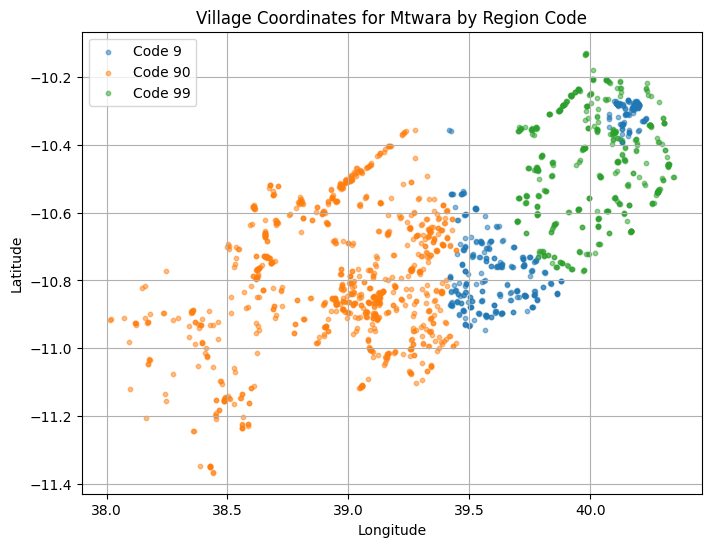

In [13]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
for code, color in zip([9, 90, 99], ['green', 'blue', 'red']):
    subset = mtwara_df[mtwara_df['region_code'] == code]
    plt.scatter(subset['longitude'], subset['latitude'], label=f'Code {code}', alpha=0.5, s=10)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Village Coordinates for Mtwara by Region Code')
plt.legend()
plt.grid(True)
plt.show()


It would be wise to map the region codes with the regions for plots/visualization

### print(df.columns.tolist())


In [16]:
geo_cols = ['gps_height', 'longitude', 'latitude', 'basin', 'region', 'region_code',
            'district_code', 'lga', 'ward', 'subvillage']

geo_df = df[geo_cols].copy()


In [17]:
geo_df

,gps_height,longitude,latitude,basin,region,region_code,district_code,lga,ward,subvillage
0,1390,34.938093,-9.856322,Lake Nyasa,Iringa,11,5,Ludewa,Mundindi,Mnyusi B
1,1399,34.698766,-2.147466,Lake Victoria,Mara,20,2,Serengeti,Natta,Nyamara
2,686,37.460664,-3.821329,Pangani,Manyara,21,4,Simanjiro,Ngorika,Majengo
3,263,38.486161,-11.155298,Ruvuma / Southern Coast,Mtwara,90,63,Nanyumbu,Nanyumbu,Mahakamani
4,0,31.130847,-1.825359,Lake Victoria,Kagera,18,1,Karagwe,Nyakasimbi,Kyanyamisa
...,...,...,...,...,...,...,...,...,...,...
59395,1210,37.169807,-3.253847,Pangani,Kilimanjaro,3,5,Hai,Masama Magharibi,Kiduruni
59396,1212,35.249991,-9.070629,Rufiji,Iringa,11,4,Njombe,Ikondo,Igumbilo
59397,0,34.017087,-8.750434,Rufiji,Mbeya,12,7,Mbarali,Chimala,Madungulu
59398,0,35.861315,-6.378573,Rufiji,Dodoma,1,4,Chamwino,Mvumi Makulu,Mwinyi


Checking the columns source, source_type and source_class

source_type is redundant, repeats information from source class.

In [48]:
df.groupby(['source', 'source_type'])['source_class'].value_counts().unstack().fillna(0)


,source_class,groundwater,surface,unknown
source,source_type,,,
dam,dam,0.0,649.0,0.0
hand dtw,borehole,873.0,0.0,0.0
lake,river/lake,0.0,639.0,0.0
machine dbh,borehole,10826.0,0.0,0.0
other,other,0.0,0.0,202.0
rainwater harvesting,rainwater harvesting,0.0,2218.0,0.0
river,river/lake,0.0,9612.0,0.0
shallow well,shallow well,15499.0,0.0,0.0
spring,spring,17006.0,0.0,0.0


same as previous cell. waterpoint_type offers more information about "communal standpipe" and "communal standpipe multiple". Otherwise its same information in two coulmns, so drop the column waterpoint_type_group.

In [49]:
df.groupby(['waterpoint_type'])['waterpoint_type_group'].value_counts().unstack().fillna(0)

waterpoint_type_group,cattle trough,communal standpipe,dam,hand pump,improved spring,other
waterpoint_type,,,,,,
cattle trough,116.0,0.0,0.0,0.0,0.0,0.0
communal standpipe,0.0,28375.0,0.0,0.0,0.0,0.0
communal standpipe multiple,0.0,5959.0,0.0,0.0,0.0,0.0
dam,0.0,0.0,7.0,0.0,0.0,0.0
hand pump,0.0,0.0,0.0,16181.0,0.0,0.0
improved spring,0.0,0.0,0.0,0.0,783.0,0.0
other,0.0,0.0,0.0,0.0,0.0,6167.0


Drop quality_group

In [52]:
df.groupby(['water_quality'])['quality_group'].value_counts().unstack().fillna(0)

quality_group,colored,fluoride,good,milky,salty,unknown
water_quality,,,,,,
coloured,479.0,0.0,0.0,0.0,0.0,0.0
fluoride,0.0,199.0,0.0,0.0,0.0,0.0
fluoride abandoned,0.0,15.0,0.0,0.0,0.0,0.0
milky,0.0,0.0,0.0,803.0,0.0,0.0
salty,0.0,0.0,0.0,0.0,4772.0,0.0
salty abandoned,0.0,0.0,0.0,0.0,228.0,0.0
soft,0.0,0.0,49431.0,0.0,0.0,0.0
unknown,0.0,0.0,0.0,0.0,0.0,1661.0


drop quantity_group

In [53]:
df.groupby(['quantity'])['quantity_group'].value_counts().unstack().fillna(0)

quantity_group,dry,enough,insufficient,seasonal,unknown
quantity,,,,,
dry,5990.0,0.0,0.0,0.0,0.0
enough,0.0,32260.0,0.0,0.0,0.0
insufficient,0.0,0.0,14564.0,0.0,0.0
seasonal,0.0,0.0,0.0,4001.0,0.0
unknown,0.0,0.0,0.0,0.0,773.0


In the case of extraction_type, perhaps extraction_type_class offers enough information about the extraction type?

In [6]:
pd.crosstab(
    index=[df['extraction_type'], df['extraction_type_group']],
    columns=df['extraction_type_class']
)


,extraction_type_class,gravity,handpump,motorpump,other,rope pump,submersible,wind-powered
extraction_type,extraction_type_group,,,,,,,
afridev,afridev,0,1770,0,0,0,0,0
cemo,other motorpump,0,0,90,0,0,0,0
climax,other motorpump,0,0,32,0,0,0,0
gravity,gravity,26780,0,0,0,0,0,0
india mark ii,india mark ii,0,2400,0,0,0,0,0
india mark iii,india mark iii,0,98,0,0,0,0,0
ksb,submersible,0,0,0,0,0,1415,0
mono,mono,0,0,2865,0,0,0,0
nira/tanira,nira/tanira,0,8154,0,0,0,0,0


In [57]:
df.groupby(['region'])['region_code'].value_counts().unstack().fillna(0)
grouped = df.groupby(['region'])['region_code'].nunique().reset_index()
grouped = grouped.rename(columns={'region_code': 'n_unique_region_code'})
print(grouped.sort_values('n_unique_region_code', ascending=False))


           region  n_unique_region_code
7           Lindi                     3
14          Pwani                     3
17      Shinyanga                     3
12         Mtwara                     3
0          Arusha                     2
20          Tanga                     2
3          Iringa                     1
2          Dodoma                     1
1   Dar es Salaam                     1
4          Kagera                     1
8         Manyara                     1
6     Kilimanjaro                     1
5          Kigoma                     1
11       Morogoro                     1
10          Mbeya                     1
9            Mara                     1
13         Mwanza                     1
16         Ruvuma                     1
15          Rukwa                     1
18        Singida                     1
19         Tabora                     1


Trying to fix the missing geo coordinates, by averaging location of known wards, then assigning these, if the entries with missing geo coordinates fall into same ward.

In [5]:
df['latitude'] = df['latitude'].apply(lambda x: pd.NA if abs(x) < 1e-6 else x)
df['longitude'] = df['longitude'].apply(lambda x: pd.NA if abs(x) < 1e-6 else x)


In [6]:
geo_fallback_order = ['ward', 'subvillage', 'lga', 'district_code', 'region']

def fill_missing_geo(df, group_cols):
    for col in group_cols:
        # Compute group-wise means (excluding missing lat/lon)
        group_means = df.dropna(subset=['latitude', 'longitude']).groupby(col)[['latitude', 'longitude']].mean()

        def fill(row):
            if pd.isna(row['latitude']) or pd.isna(row['longitude']):
                key = row[col]
                if key in group_means.index:
                    if pd.isna(row['latitude']):
                        row['latitude'] = group_means.loc[key, 'latitude']
                    if pd.isna(row['longitude']):
                        row['longitude'] = group_means.loc[key, 'longitude']
            return row

        df = df.apply(fill, axis=1)

        # Stop early if no more NaNs
        if df['latitude'].isna().sum() == 0 and df['longitude'].isna().sum() == 0:
            break

    return df

df = fill_missing_geo(df, geo_fallback_order)


In [7]:
print("Still missing latitude:", df['latitude'].isna().sum())
print("Still missing longitude:", df['longitude'].isna().sum())


Still missing latitude: 0
Still missing longitude: 0


This eliminates the 0s and NaNs, and instead fills in estimated/average/mean location based on ward, lga, subvillage or region.

In [12]:
import plotly.express as px

fig = px.scatter_geo(df,
                     lat='latitude',
                     lon='longitude',
                     hover_name='id',  # or any other column
                     scope='africa')  # assuming this is Tanzania

fig.show()


Now trying to handle missing (0 and 1) values fopr population feature.

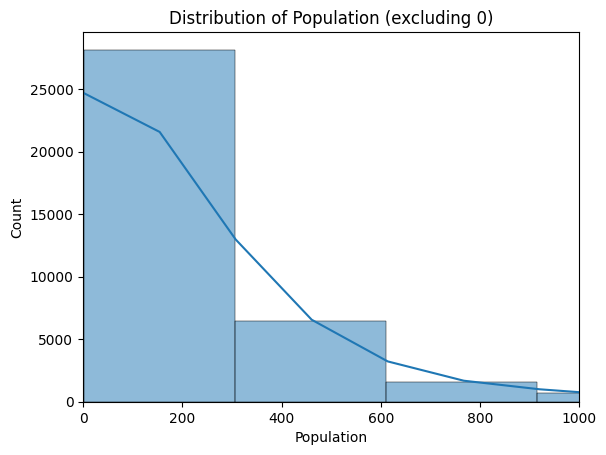

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.histplot(df[df['population'] > 0]['population'], bins=100, kde=True)
plt.title("Distribution of Population (excluding 0)")
plt.xlabel("Population")
plt.ylabel("Count")
plt.xlim(0, 1000)  # Optional: focus on lower range for better visibility
plt.show()


In [6]:
from scipy.stats import skew

pop_skew = skew(df[df['population'] > 0]['population'])
print("Skewness:", pop_skew)


Skewness: 10.98847966932757


In [7]:
pop_vals = df[df['population'] > 0]['population']
print("Mean:", pop_vals.mean())
print("Median:", pop_vals.median())


Mean: 281.08716694284436
Median: 150.0


Same logic as before (latitude/longitude) to fill in the missing values. However, since data is skewed to one side, consider imputing with median instead of mean.

In [8]:
import pandas as pd

# 1. Convert suspicious population values to NaN
df['population'] = df['population'].apply(lambda x: pd.NA if x in [0, 1] else x)

# 2. Define fallback order from most local to most general
fallback_order = ['ward', 'lga', 'district_code', 'region']

# 3. Imputation function using median per group
def fill_missing_population(df, levels):
    for level in levels:
        # Calculate median population per group (excluding missing)
        group_medians = df.dropna(subset=['population']).groupby(level)['population'].median()

        def fill(row):
            if pd.isna(row['population']):
                key = row[level]
                if key in group_medians:
                    row['population'] = group_medians.loc[key]
            return row

        df = df.apply(fill, axis=1)

        # Exit early if all values are filled
        if df['population'].isna().sum() == 0:
            break

    return df

# 4. Apply the imputation
df = fill_missing_population(df, fallback_order)

# Optional: Check remaining NaNs
print("Remaining missing population values:", df['population'].isna().sum())


Remaining missing population values: 0


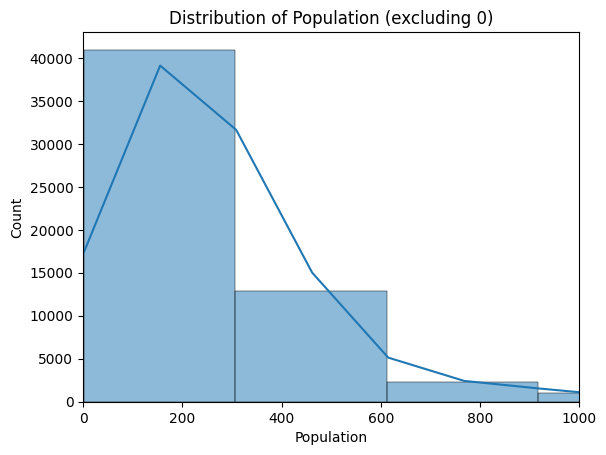

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.histplot(df[df['population'] > 0]['population'], bins=100, kde=True)
plt.title("Distribution of Population (excluding 0)")
plt.xlabel("Population")
plt.ylabel("Count")
plt.xlim(0, 1000)  # Optional: focus on lower range for better visibility
plt.show()


There are still some entries with small value for population 

In [20]:
# Find rows where population is 0
population_zero_df = df[df['population'] == 5]

# Display how many such rows there are
print("Number of rows with population == 0:", population_zero_df.shape[0])

# Optional: display first few rows
print(population_zero_df.head())


Number of rows with population == 0: 44
         id  amount_tsh date_recorded           funder  gps_height  \
1715  57501         7.0    2013-11-03  germany republi        1263   
1934  29700        10.0    2013-09-03              giz         812   
2154  27536      1500.0    2011-03-03            fathe        1966   
2921  62703         5.0    2013-12-03  germany republi        1055   
3060  74163         0.0    2011-03-04            fathe        1945   

       installer  longitude  latitude              wpt_name  num_private  ...  \
1715         ces  37.219830 -3.237583  kwa lingishi songoya            0  ...   
1934  kili water  37.474303 -3.388772            kwa mipale            0  ...   
2154       fathe  34.822232 -9.556161                  none            0  ...   
2921         ces  37.198002 -3.306252        kwa arda amery            0  ...   
3060       villa  34.741290 -9.378286                  none            0  ...   

     water_quality quality_group quantity  quantity_

Trying to trian a classifier with some selection of features. Just to see if the choice of features gives somewhat accurate prediction?

In [9]:
columns_to_drop = [
    'id', 'longitude', 'latitude', 'basin', 'region', 'region_code',
    'district_code', 'lga', 'ward', 'population', 'source_type',
    'waterpoint_type_group', 'quality_group', 'quantity',
    'extraction_type_class', 'management_group', 'payment_type'
]

df_final = df.drop(columns=columns_to_drop)


In [11]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# Separate features and target
X = df_final.drop(columns=['status_group'])  # replace with actual target column
y = df_final['status_group']

# Detect types
num_cols = X.select_dtypes(include='number').columns.tolist()
cat_cols = X.select_dtypes(include='object').columns.tolist()


In [12]:
# Numeric pipeline
num_transformer = StandardScaler()

# Categorical pipeline
cat_transformer = OneHotEncoder(handle_unknown='ignore')

# Full preprocessing
preprocessor = ColumnTransformer(
    transformers=[
        ('num', num_transformer, num_cols),
        ('cat', cat_transformer, cat_cols)
    ])


In [15]:
from sklearn.ensemble import RandomForestClassifier  # <-- change this import

model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))  # <-- change this line
])


In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model.fit(X_train, y_train)


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['amount_tsh', 'gps_height',
                                                   'num_private',
                                                   'construction_year']),
                                                 ('cat',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['date_recorded', 'funder',
                                                   'installer', 'wpt_name',
                                                   'subvillage',
                                                   'public_meeting',
                                                   'recorded_by',
                                                   'scheme_management',
                                                   'scheme_name', 'permit',
                                                   'extraction_type',
                                                   'extraction_type_group',
                                                   'management', 'payment',
                                                   'water_quality',
                                                   'quantity_group', 'source',
                                                   'source_class',
                                                   'waterpoint_type'])])),
                ('classifier', RandomForestClassifier(random_state=42))])

In [18]:
from sklearn.metrics import classification_report, accuracy_score

y_pred = model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))



Accuracy: 0.8093434343434344

Classification Report:

                         precision    recall  f1-score   support

             functional       0.80      0.90      0.85      6457
functional needs repair       0.61      0.30      0.41       851
         non functional       0.84      0.77      0.81      4572

               accuracy                           0.81     11880
              macro avg       0.75      0.66      0.69     11880
           weighted avg       0.80      0.81      0.80     11880

